# Waveforms

Waveforms carries multifactorial information:
- **Frequency**: The *rate of oscillation* of the waveform, which determines the *pitch* of a sound. Higher frequencies correspond to higher pitches, while lower frequencies correspond to lower pitches. 

- **Amplitude**: Also known as intensity, amplitude represents the *strength* or *loudness* of the waveform. Higher amplitudes correspond to louder sounds, while lower amplitudes correspond to softer sounds.

- **Timbre**: Timbre refers to the *quality* or *tone color* of a sound. It distinguishes between different instruments or voices even when they are playing the same note at the same volume. Timbre is influenced by various factors, including the harmonic content, envelope, and other spectral characteristics of the waveform.

- **Periodic Waveforms**:
   - These waveforms repeat themselves over time.
   - They have a fundamental period, which is the smallest interval of time after which the waveform repeats.
   - Examples include sine waves, square waves, and triangular waves.
   - Mathematically, a periodic waveform $ f(t) $ satisfies $ f(t) = f(t + T) $ for all $ t $, where $ T $ is the period.

- **Aperiodic Waveforms**:
   - These waveforms do not repeat themselves over time.
   - They may have transient components or random variations that prevent exact repetition.
   - Examples include impulses, noise signals, and most real-world audio signals.
   - Mathematically, an aperiodic waveform does not satisfy $ f(t) = f(t + T) $ for any value of $ T $ other than $ T = 0 $.



# The sine wave

## $y(t) = A sin (2\pi ft + \varphi)$

Signal with an amplitude A, frequency f, phase $\varphi$ and time variable t.

Frequency as the amount of time (period (T)).

Frequency is the inverse of the period $f = \frac{1}{T}$

Amplitude is how "high" or "low" the perturbation in air pressure goes.

Phase (phi) enables us to shift the waveform to the "right" or "left"

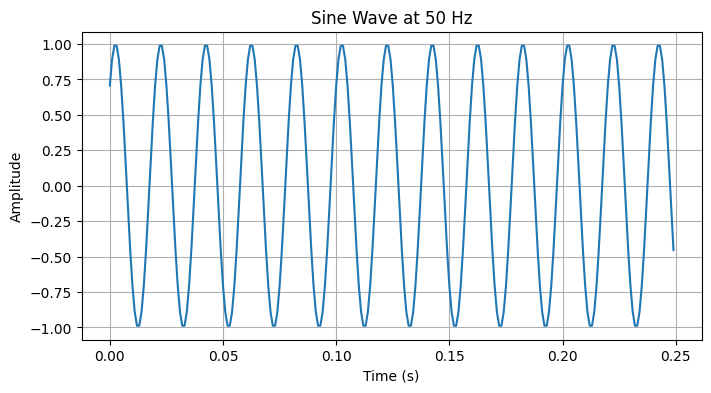

In [2]:
import numpy as np
import matplotlib.pyplot as plt

def plot_sine_wave(A, f, phi, duration=1, sampling_rate=1000):
    t = np.linspace(0, duration, int(duration * sampling_rate), endpoint=False)
    y = A * np.sin(2 * np.pi * f * t + phi)
    
    plt.figure(figsize=(8, 4))
    plt.plot(t, y)
    plt.title(f'Sine Wave at {f} Hz')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

A = 1  # Amplitude
f = 50  # Frequency (Hz)
phi = np.pi/4  # Phase (radians)
duration = 0.25  # Duration of the signal in seconds
sampling_rate = 1000  # Sampling rate in Hz

plot_sine_wave(A, f, phi, duration, sampling_rate)


# About pitch

Pitch, as perceived by humans, follows a logarithmic scale rather than a linear one. This means that the perceived difference in pitch between two musical tones is not directly proportional to the difference in their frequencies. Instead, the perceived pitch difference between two tones increases as the frequency increases.

In music theory, the equal temperament tuning system is commonly used, where the frequency ratio between adjacent notes in the chromatic scale is constant. This results in a logarithmic relationship between musical pitches. For example, moving up an octave doubles the frequency of a note, while moving down an octave halves it. Similarly, each semitone step within an octave corresponds to a frequency ratio of $2^{1/12}$ times the previous frequency.

This logarithmic nature of pitch perception is essential for understanding the organization of musical scales, intervals, and harmonies in music. It also plays a crucial role in the design of musical instruments, audio processing algorithms, and various aspects of auditory perception research.

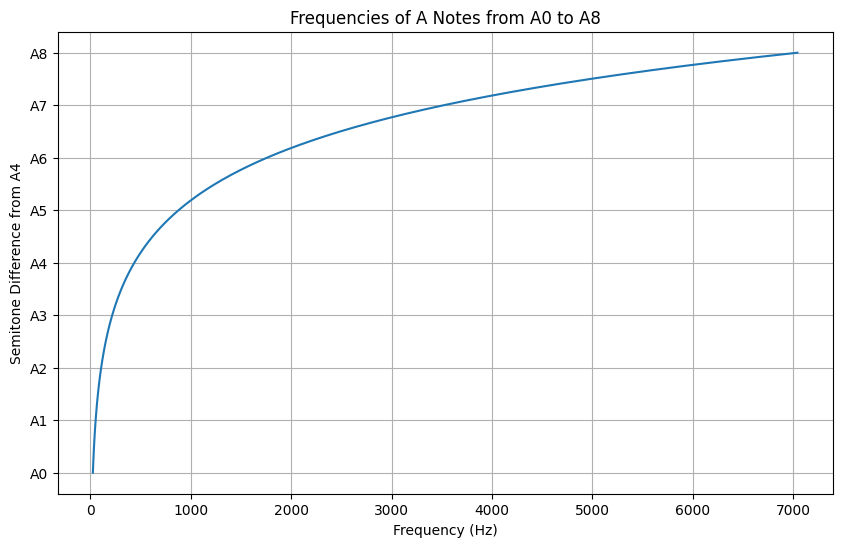

In [3]:
def calculate_frequency(A4_freq, semitone_diff):
    return A4_freq * (2 ** (semitone_diff / 12))

def plot_A_notes():
    A4_freq = 440  # Frequency of A4 note
    semitone_diff = np.arange(-48, 49)  # Semitone difference from A4 for A0 to A8

    A_notes = calculate_frequency(A4_freq, semitone_diff)
    A_note_names = [f'A{i}' for i in range(9)]

    plt.figure(figsize=(10, 6))
    plt.plot(A_notes, semitone_diff, linestyle='-')
    plt.title('Frequencies of A Notes from A0 to A8')
    plt.ylabel('Semitone Difference from A4')
    plt.xlabel('Frequency (Hz)')
    plt.yticks(np.arange(-48, 49, 12), A_note_names)
    plt.grid(True)
    plt.show()

plot_A_notes()

# Intensity, Loudness, and Timbre

## Intensity level
- Logarithmic scale
- Measured in decibels (dB)
- Ratio between two intensity values
- Use an intensity of references (TOH (Threshold of hearing))

$dB(I) = 10 \times log_{10}(\frac{I}{I_{TOH}}) $

Every ~3 dB, intensity doubles.


| Source | Intensity | Intensity level | x TOH |
| ------ | --------- | --------------- | ----- |
| Threshold of hearing (TOH) | 10<sup>-12</sup> | 0 dB | 1 |
| Whisper | 10<sup>-10</sup> | 20 dB | 10<sup>2</sup> |
| Pianissimo | 10<sup>-8</sup> | 40 dB | 10<sup>4</sup> |
| Normal conversation | 10<sup>-6</sup> | 60 dB | 10<sup>6</sup> |
| Fortissimo | 10<sup>-2</sup> | 100 dB | 10<sup>10</sup> |
| Threshold of pain | 10 | 130 dB | 10<sup>13</sup> |
| Jet take-off | 10<sup>2</sup> | 140 dB | 10<sup>14</sup> |
| Instant perforation of eardrum | 10<sup>4</sup> | 160 dB | 10<sup>16</sup> |

Intensity is measured as watts over m<sup>2</sup>

Relative intensitive level

Müller, Fundamentals of Music Processing, Springer 2015

## Loudness
- Subjective perception of sound intensity
- Depend on duration / frequency of a sound
- Depends on age
- Measured in *phons*

## Timbre
- Lacks a real and comprehensive definition
- *Color* of sound
- Diff between two sounds with the same intensity, freq and duration
- Described with fuzzy words like: bright, dark, dull, harsh, warm

### Features of timbre
- Multidimensional
- Sound envelope
- Harmonic content
- Amplitude / frequency modulation

### Sound envelope
- Attack-Decay-Sustain-Release Model (ADSR-model)

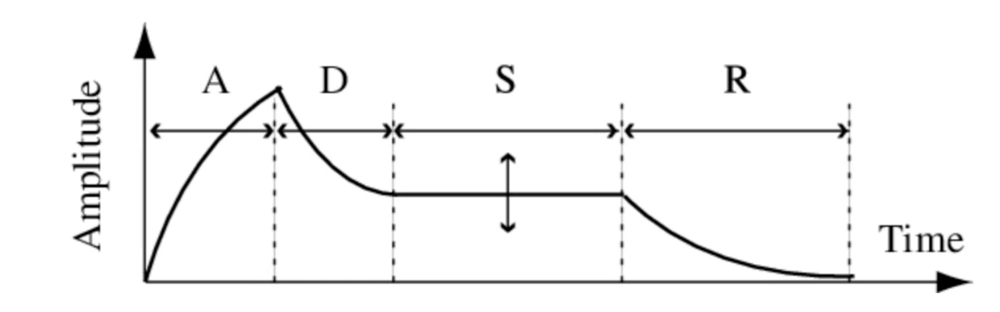


# Complex sounds
- Superposition of sinusoids
- A *partial* is a sinusoid used to describe a sound
- The lowest partial is called *fundamental frequency*
- A harmonic partial is a frequency tht's a multiple of the fundamental frequency
- *Inharmonicity* indicates a deviation from a harmonic partial


In [4]:
import os
import librosa, librosa.display
import IPython.display as ipd

In [5]:
BASE_FOLDER = "data/one-shots"
violin_sound_file = "violin_c4.wav"
piano_sound_file = "piano_c3.wav"
tremolo_sound_file = "violin_tremolo_c4.wav"
riddim_sound_file = "riddim_screech.wav"

In [6]:
# load sounds
violin_c4, _ = librosa.load(os.path.join(BASE_FOLDER, violin_sound_file))
piano_c3, _ = librosa.load(os.path.join(BASE_FOLDER, piano_sound_file))
violin_tremolo, _ = librosa.load(os.path.join(BASE_FOLDER, tremolo_sound_file))
riddim_screech, _ = librosa.load(os.path.join(BASE_FOLDER, riddim_sound_file))

In [7]:
def plot_spectrogram(signal, name):
    """Compute power spectrogram with Short-Time Fourier Transform and plot result."""
    spectrogram = librosa.amplitude_to_db(librosa.stft(signal))
    plt.figure(figsize=(20, 15))
    librosa.display.specshow(spectrogram, y_axis="log")
    plt.colorbar(format="%+2.0f dB")
    plt.title(f"Log-frequency power spectrogram for {name}")
    plt.xlabel("Time")
    plt.show()
    

In [8]:
ipd.Audio(os.path.join(BASE_FOLDER, violin_sound_file)) 

/var/folders/5h/sxsv24qn7px_bth2j_yzldlr0000gn/T/ipykernel_34714/2912319097.py:3: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  spectrogram = librosa.amplitude_to_db(librosa.stft(signal))


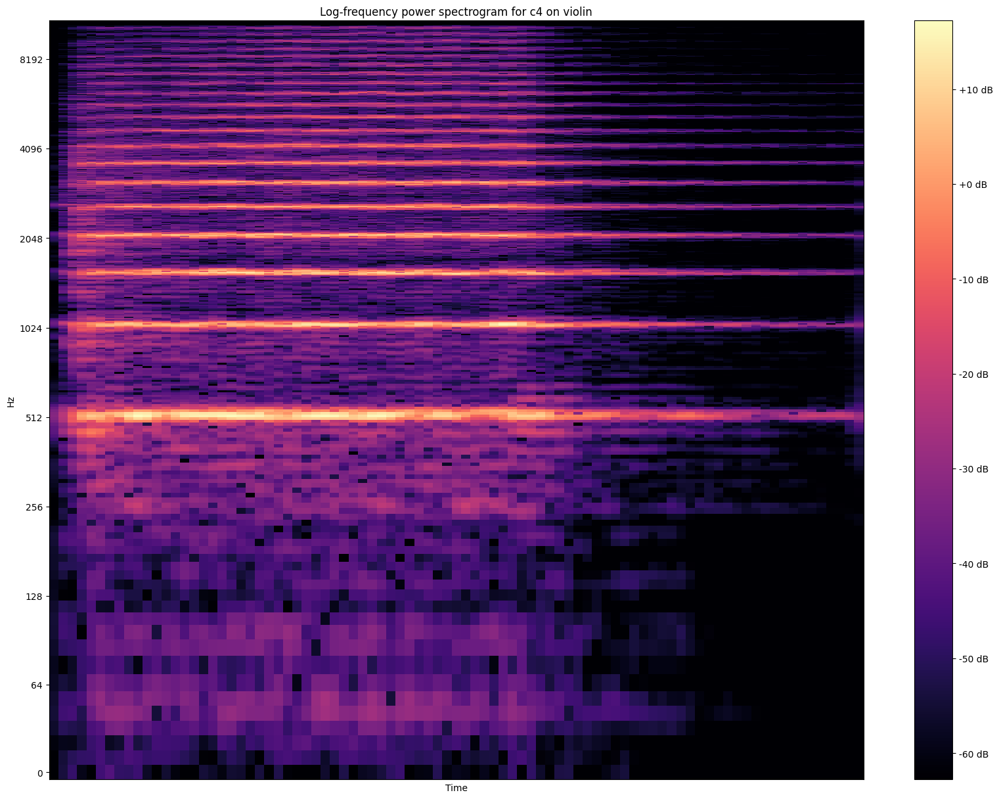

In [9]:
plot_spectrogram(violin_c4, "c4 on violin")

In [10]:
ipd.Audio(os.path.join(BASE_FOLDER, piano_sound_file)) 

/var/folders/5h/sxsv24qn7px_bth2j_yzldlr0000gn/T/ipykernel_34714/2912319097.py:3: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  spectrogram = librosa.amplitude_to_db(librosa.stft(signal))


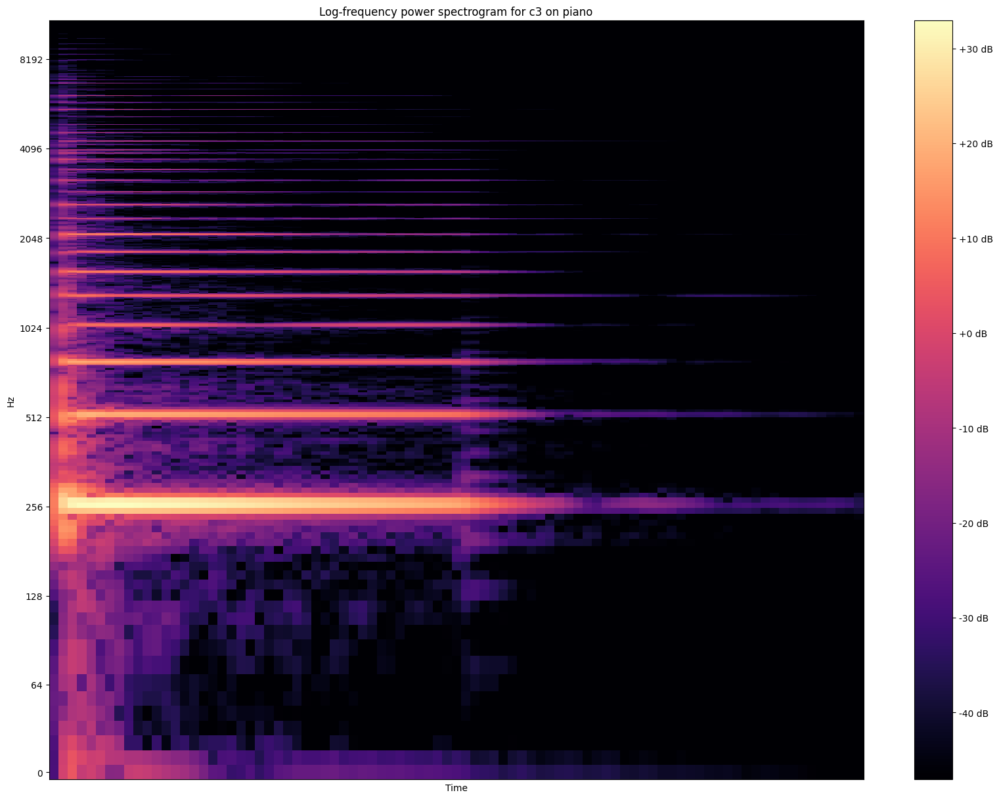

In [11]:
plot_spectrogram(piano_c3, "c3 on piano")

In [12]:
ipd.Audio(os.path.join(BASE_FOLDER, tremolo_sound_file)) 

/var/folders/5h/sxsv24qn7px_bth2j_yzldlr0000gn/T/ipykernel_34714/2912319097.py:3: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  spectrogram = librosa.amplitude_to_db(librosa.stft(signal))


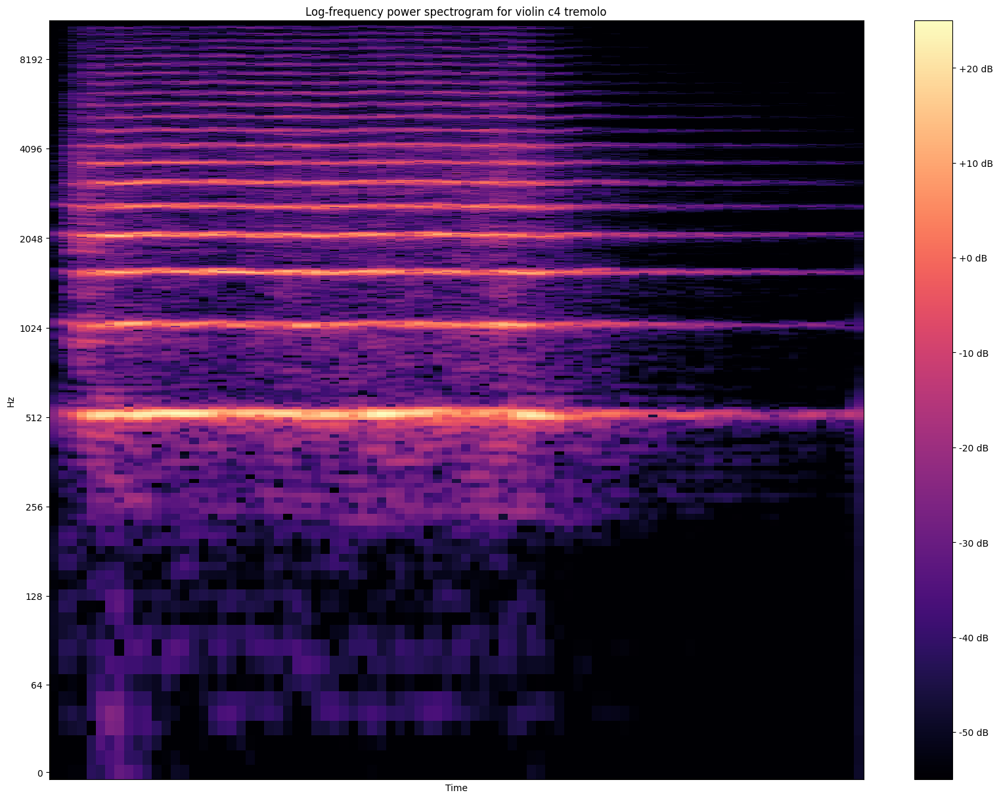

In [13]:
plot_spectrogram(violin_tremolo, "violin c4 tremolo")

In [14]:
ipd.Audio(os.path.join(BASE_FOLDER, riddim_sound_file)) 

/var/folders/5h/sxsv24qn7px_bth2j_yzldlr0000gn/T/ipykernel_34714/2912319097.py:3: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  spectrogram = librosa.amplitude_to_db(librosa.stft(signal))


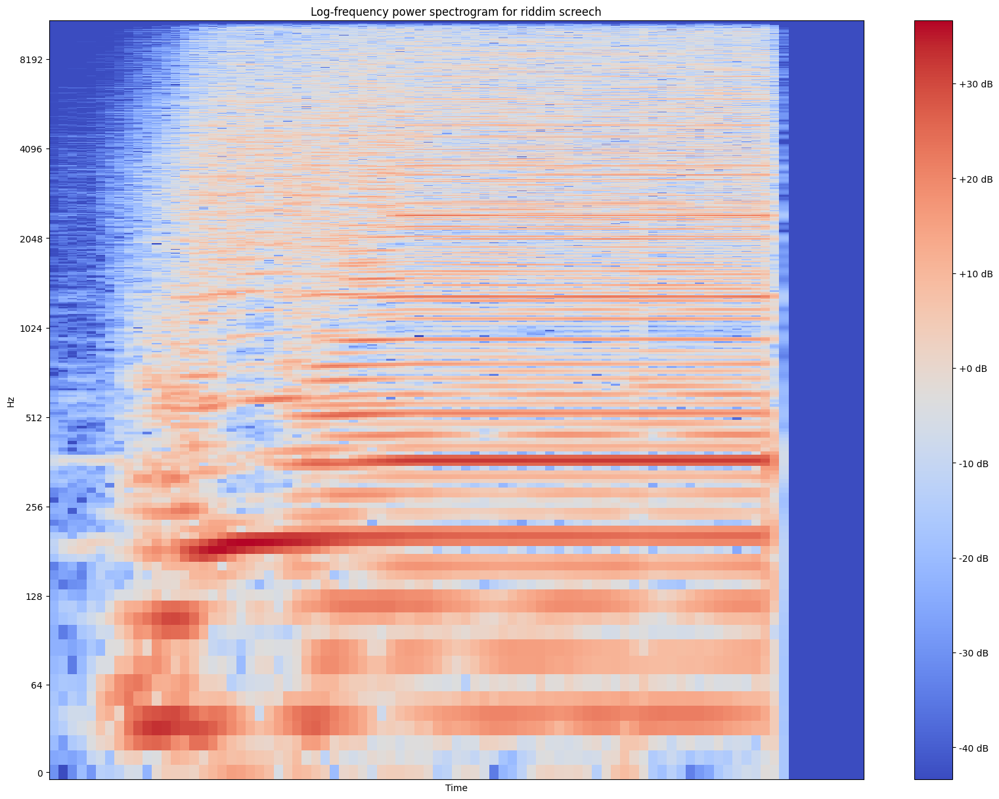

In [15]:
plot_spectrogram(riddim_screech, "riddim screech")

# Frequency modulation (FM)
- AKA vibrato
- Periodic variation in frequency
- Apply a message signal on a carrier signal on frequecy

# Amplitude modulation (AM)
- AKA tremolo 
- Periodic variation in amplitude
- Apply a message signal on a carrier signal on amplitude

# Audio Features

- Level of abstraction

- Temporal scope

- Music aspect

- Signal domain

- ML approach

### Level of abstraction
- High level
    - Instrumentation, key, chord, melody, rythm, tempo, lyrics, genre, mood
    - Very abstract features, tend to map to musical constructs that we can understand and perceive

- Mid level
    - Pitch- and beat-related descriptors such as note onsets, fluctuation patterns, MFCCs
    - Makes somewhat sense from a perceptual perspective

- Low level
    - Amplitude envelope, energy, spectral centroid, spectral flux, zero-crossing rate 
    - Low level features makes sense for the machine, but not that much for us human beings (in terms of just describing music)


Knees, P. & Schedl, M. (2016) Music similarity and retrieval: an introduction to audio and web-based strategies


### Temporal scope
- Instanteneous (~50 ms)
    - Very short chunks of audio signal. Plays important role in stereo / sound localization
- Segmentet-level (seconds)
    - Calculate as segments. Features that give us information about a bar or a musical phrase. 
- Global
    - Aggregated from lower temporal features, use some kind of average that describes the whole sound, the whole signal.


### Music aspect
- Beat
- Timbre
- Pitch
- Harmony
- etc...


# Signal domain
- Time domain
    - Amplitude envelope, root-mean square energy, zero crossing rate, etc. 
        - Extracted from waveforms
        - Time domain in a waveform contains all events that happens in a sound
        - Problem: Sound is characterized by frequencies, the time domain representation doesn't contain frequencies

- Frequency domain
    - Band energy ratio, spectral centroid, spectral flux, etc.
        - We take the raw audio from its time-domain representation, apply the fourier transform, and translate the signal from the time domain to the frequency domain, this gives us a spectrum. (Frequency and magnitude).

Time domain and frequency domain complements each other.
Problem: With this representations we don't have both of these things together.

Solution:
- Time-frequency domain features
    - spectrogram, Mel-spectrogram, Constant-Q transform, etc

### ML Approach
- Traditional machine learning (SVM, logistic or linear regression etc)
- Deep Learning

### Traditional ML
- Amplitude envelope
- Root-mean square energy
- Zero crossing rate
- Band energy ratio
- Spectral centroid
- Spectral flux
- Spectral spread
- Spectral roll-off
- etc

### Deep Learning
- Unstructured representations
- Spectrogram
- MFCCs
- etc

# Types of intelligent audio systems

DSP -> Rule-based systems
- Classify sound, recognize beat etc.

Traditional ML -> Feature engineering

Deep Learning -> Automatic feature extraction from raw audio
- No manual feature engineering required


https://www.youtube.com/redirect?event=video_description&redir_token=QUFFLUhqbWxZaGxoSGlkUlNJOUY2dWcyYzlYRkhCcTN5d3xBQ3Jtc0tseUJBd0hyMFhETDhjbzJUWE11OXJDOXRCZ1BXa0VHUmlqTUY4NUpPNUZjS1FOZHhfOUpOc0UzQ2RISU8wWkU2V2IzSk1rNzFHcElLVkQ0em5GUG51eWQ4S25KRlJvbWhCQ05vNlJhN3J6ZjNXWThzWQ&q=https%3A%2F%2Fgithub.com%2Fmaziarraissi%2FApplied-Deep-Learning&v=hF72sY70_IQ

# Extraction pipelines for time and frequency features

## Time domain feature pipeline

### Frames: Percievable audio chunk

1 sample @44.1KHz = 0.0227 ms (1/44100) == Way below human hearing.
With frames, we want to achieve enough duration so the audio makes sense from an acoustic perspective.

Frames have a number of samples, we want to apply FT and FFT, having a power of 2 num. samples will speed up

Typical values: 257-8192

The duration of a frame

$d_{f} = 1 \frac{1}{S_{r}}\cdot{K}$

The duration of the frame, $d_{f}$, is the inverse of the  sampling rate, $\frac{1}{S_{r}}$, multiplied by frame size.

The first element tells us the duration of a single sample, multiplied by the total samples in the frame.

Let's plug some usul numbers in

SR = 44100
K = 512

df = 1/44100 * 512 = 11.6 ms

- Analog-digital-conversion (qunantify / sample)
- Framing (bundle together samples)
    - frame 1: sample 1 ... sample 128
    - frame 2: sample 64 ... sample 192
    etc.
- Some frames can overlap


After we apply framing, we compute the feaures, and then aggregate (mean, median, GMM (gaussian mixture) other statistical mean or gaussian mixture) -> final value (feature value/vector/matrxi) which is a snapshot of the whole duration of the audio signal that we're analyzing.

## Frequency domain feature pipeline

Many steps are the same as the time domatin.

- Start with analog sound, apply ADC, frame the signal etc.

From time to frequency domain (FT).. but:

# Spectral leakage

- Processing a signal that isn't an integer number of periods
- Endpoints are discontinuous

![alt text](assets/img/endpoints.png)

- Discontinuities appear as high-frequency components not present in the original signal, just artefacts that appears because we apply FFT on the endpoints

We minimizing spectral leakage with windowing

## Windowing
- Apply a windowing function to each frame before we feed the frame into FT
- Eliminates samples at both ends of a frame: creating a periodic signal.

## Hann window

$w(k) = 0.5 \cdot (1 - cos(\frac{2\pi k}{K-1})),k= 1...K$

Hann window and wavelets.

But a new problem: Putting together frames which have been windowd, we lose signal at the beginning and the end of the frames. The solution is **overlapping frames**.

Hop length / hop size = the amount of samples that we shift to the "right" every time we take a new frame.



# Time domain audio features

Low-level acoustic featues:
- Amplitude enevelope (AE)
- Root-mean-square energy (RMS)
- Zero-crossing rate (ZCR)
- ...

Taken from each frame in an audio signal. Then aggregate for statistical mean, or other.

## AE (Amplitude envelope)
- Max amplitude value of all samples in a frame
- Gives rough idea of loudness
- Sensitive to outliers
- Onset detection, music genre classification
    - Example: Understand when an acoustic event, such as a note, starts

$AE_t$, amplitude envelope at frame t

${\displaystyle AEt = \max_{k=t\cdot K}^{t+1\cdot K-1}} s(k)$

For each frame, take the highest value of the amplitude.


## Extracting amplitude envelope features from scratch


In [16]:
import librosa
import librosa.display
import IPython.display as ipd

sample00 = "output.wav" # Sine waves generated with Numpy

In [17]:
ipd.Audio(sample00)

In [18]:
sines, sr = librosa.load(sample00)

In [19]:
sines.size # Samples

88200

In [20]:
sample_duration = 1 / sr # Inverse of sample rate
print(f"{sample_duration*100:.6f} ms") # Duration of 1 sample

0.004535 ms


In [21]:
duration = sample_duration * sines.size
print(f"{duration} seconds") # Duration of the audio signal

4.0 seconds


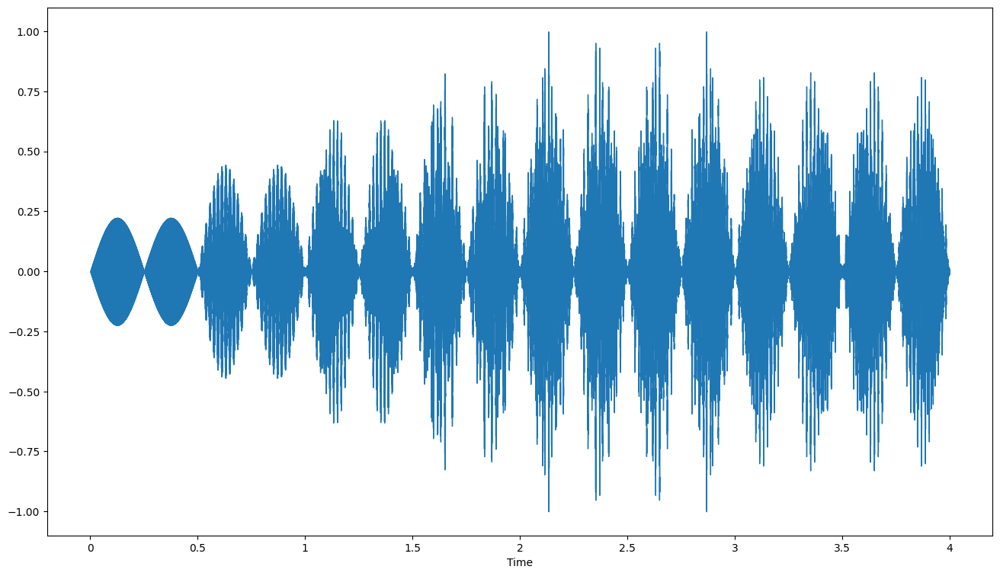

In [22]:
import matplotlib.pyplot as plt

plt.figure(figsize=(16,9))
librosa.display.waveshow(sines, sr=sr)

In [23]:
import plotly.express as px
import numpy as np
import pandas as pd

# Create df for Plotly, might be a better solution out there
time = np.arange(0, len(sines)) / sr
data = {"Time (s)": time, "Amplitude": sines}
df = pd.DataFrame(data)

fig = px.line(df, x="Time (s)", y="Amplitude", title="")
fig.show()

In [24]:
# Non overlapping frames
def amplitude_envelope(signal, frame_size):
    amplitude_envelope = []

    for i in range(0, len(signal), frame_size):
        current_frame_amplitude_envelope = max(signal[i:i+frame_size])
        amplitude_envelope.append(current_frame_amplitude_envelope)

    return np.array(amplitude_envelope)

In [25]:
ae_sines = amplitude_envelope(sines, 512)
len(ae_sines)

173

In [26]:
# Using overlapping frames
FRAME = 1024
HOP = 512
def amplitude_envelope(signal, frame_size, hop_length):
    amplitude_envelope = []

    # Instead of jumping each iteration by frame size, we hop by hop length
    for i in range(0, len(signal), hop_length):
        current_frame_amplitude_envelope = max(signal[i:i+frame_size])
        amplitude_envelope.append(current_frame_amplitude_envelope)

    return np.array(amplitude_envelope)

In [27]:
ae_sines = amplitude_envelope(sines, FRAME, HOP)
len(ae_sines)

173

In [28]:
def fancy_amplitude_envelope(signal, frame_size, hop_length):
    return np.array([max(signal[i:i+frame_size]) for i in range(0,signal.size, hop_length)])

In [29]:
fancy_ae_sines = fancy_amplitude_envelope(sines, FRAME, HOP)
len(ae_sines)

173

In [30]:
(ae_sines == fancy_ae_sines).all()

True

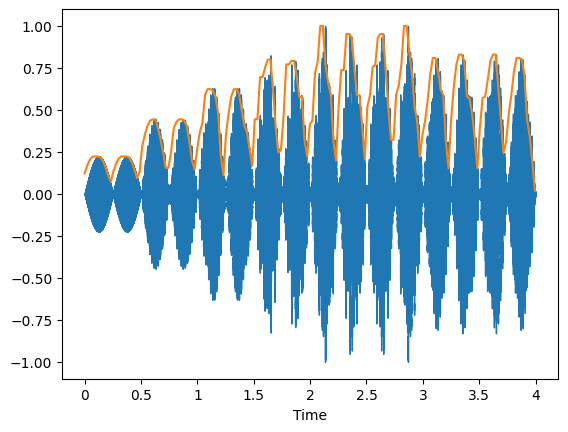

In [31]:
frames = range(0, ae_sines.size)
t = librosa.frames_to_time(frames, hop_length=HOP)

librosa.display.waveshow(sines, sr=sr)
plt.plot(t, ae_sines)

## RMS (Root-mean-square energy)
- RMS of all samples in a frame
- Indicator of loudness
- Less sensitive to outliers than AE
- Audio segmentation, music genre classification

$RMS_t$, RMS at frame t

$RMS_t = \sqrt{\frac{1}{K}\cdot\sum\limits_{k=t\cdot K}^{(t+1)\cdot K-1}s(k)^2} $

In [32]:
def rms(signal, frame_length, hop_length):
    rms = [] # contains rms for each frame

    for i in range(0, len(signal), hop_length):
        rms_current_frame = np.sqrt(np.sum(signal[i:i+frame_length]**2) / frame_length)
        rms.append(rms_current_frame)
    
    return np.array(rms)

In [33]:
FRAME_LENGTH = 1024
HOP_LENGTH = 512

In [34]:
rms_sines = rms(sines, FRAME_LENGTH, HOP_LENGTH) 

In [35]:
rms_sines.shape

(173,)

In [36]:
rms_sines_librosa = librosa.feature.rms(y=sines, frame_length=FRAME_LENGTH, hop_length=HOP)[0]

https://librosa.org/doc/main/generated/librosa.feature.rms.html

In [37]:
rms_sines_librosa.shape

(173,)

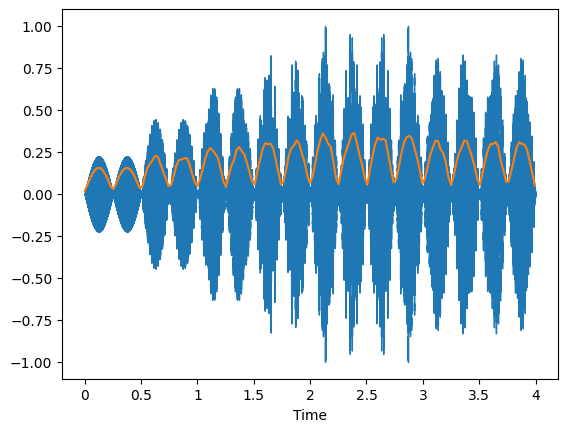

In [38]:
librosa.display.waveshow(sines, sr=sr)
plt.plot(t, rms_sines_librosa)


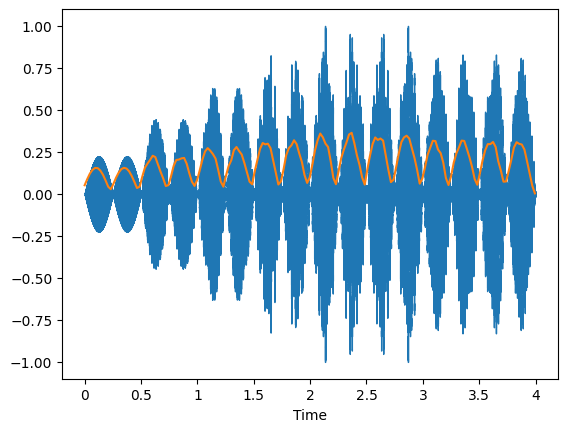

In [39]:
librosa.display.waveshow(sines, sr=sr)
plt.plot(t, rms_sines)


Less variability and outliers compared to AE, we are considering all the samples in a frame, instead of taking the max.

## Zero-crossing rate
- Number of times a signal crosses the horizontal axis
- Recoginition of percussive vs pitches sound
- Monophonic pitch estimation
- Voice/unvoiced decision for speech signal



$ZCR_t$

$ZCR_t = \frac{1}{2}\cdot \sum\limits_{k=t\cdot K}^{t+1\cdot K-1} | sgn(s(k)) - sgn(s(k+1)) |$

Sign function:
- s(k) > 0 -> +1
- s(k) < 0 -> -1
- s(k) = 0 -> 0

In [40]:
zcr_sines = librosa.feature.zero_crossing_rate(y=sines, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH)[0]

In [41]:
zcr_sines.shape

(173,)

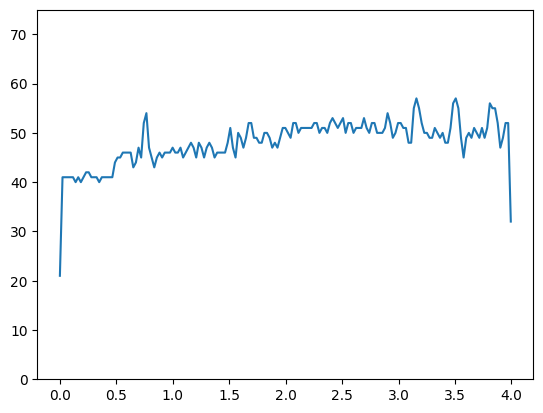

In [42]:
plt.ylim(0,75)
plt.plot(t, zcr_sines * FRAME_LENGTH) # multiply by frame length to avoid normalization


# Fourier Transform

- Decompose a complex sound into its frequency components
- From time to frequency domain
- Compare signal with sinusoids of various frequencies

For each frequency we get a magnitude and a phase. High magnitude indicates high similarity between the signal and a sinusoid.

Calculating phase:

$\varphi_f = argmax_{\varphi\in[0,1)]}(\int s(t)\cdot \sin(2\pi \cdot(ft-\varphi ))\cdot dt)$

Calculate area with integral.

Select phase in [0,1) that maximise the area.

Calculate magnitude:

$d_f = \max_{\varphi\in[0,1)]}(\int s(t)\cdot \sin(2\pi \cdot(ft-\varphi ))\cdot dt)$

Sample a continuous function to get a discrete version of it.



In [43]:
import scipy as sp
ft = sp.fft.fft(sines)
magnitude = np.absolute(ft)
frequency = np.linspace(0, sr, len(magnitude))

https://docs.scipy.org/doc/scipy/tutorial/fft.html

(300.0, 700.0)

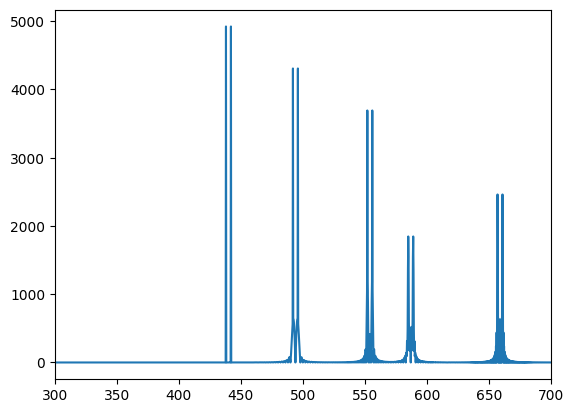

In [44]:
plt.plot(frequency[:5000], magnitude[:5000])
plt.xlim(300,700)

In [45]:
samples = range(len(sines))
t  = librosa.samples_to_time(samples, sr=sr)

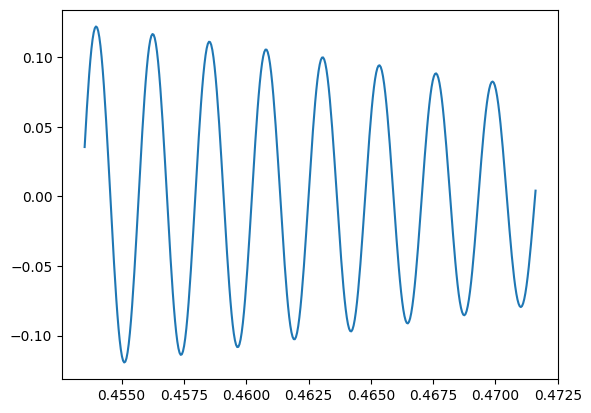

In [46]:
plt.plot(t[10000:10400], sines[10000:10400])

Zooming into the waveform, only using 400 samples by slicing the signal on the y-axis.

Compare this with sinusoid.

Text(0, 0.5, 'Amplitude')

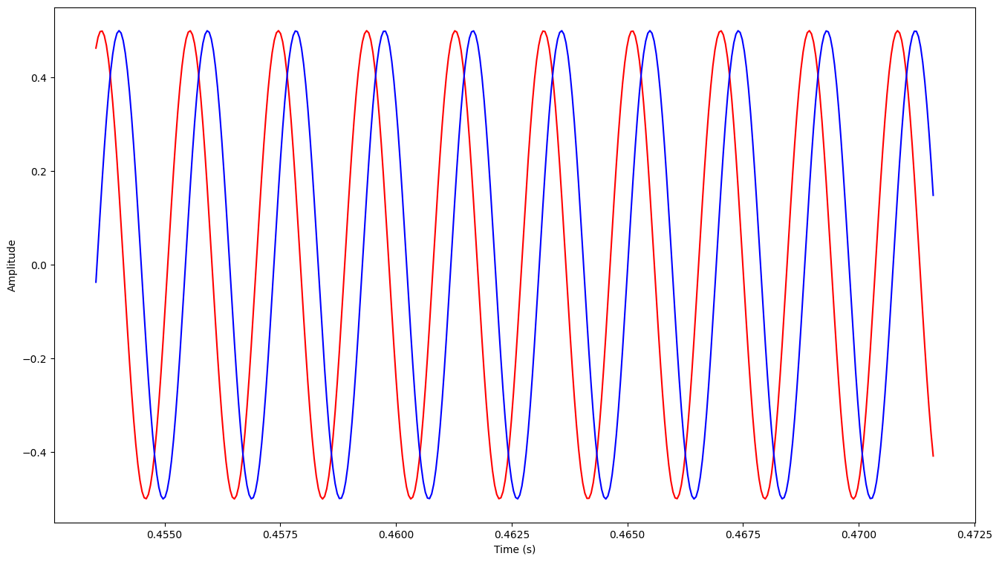

In [47]:
f = 523
phase = 0
phase2 = 0.2

sin = 0.5 * np.sin(2*np.pi * (f * t - phase ))
sin2 = 0.5 * np.sin(2*np.pi * (f * t - phase2 ))

plt.figure(figsize=(16,9))
plt.plot(t[10000:10400], sin[10000:10400], color="r")
plt.plot(t[10000:10400], sin2[10000:10400], color="b")

plt.xlabel("Time (s)")
plt.ylabel("Amplitude")

In a periodic wave the phase moves between 0 and 1.

Text(0, 0.5, 'Amplitude')

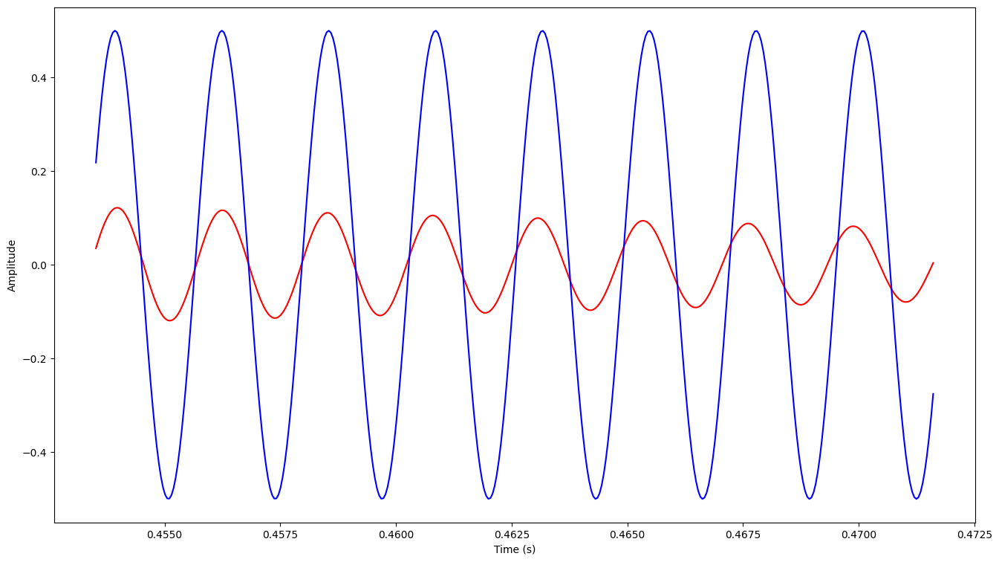

In [48]:
f = 433
phase = 0.3

sin = 0.5 * np.sin(2*np.pi * (f * t - phase ))

plt.figure(figsize=(16,9))
plt.plot(t[10000:10400], sines[10000:10400], color="r")
plt.plot(t[10000:10400], sin[10000:10400], color="b")

plt.xlabel("Time (s)")
plt.ylabel("Amplitude")

How to calculate similarity?

Combine the two signals by multiplying the two signals (sample by sample) and look at the area below the new combined signal. Add the positive area and subtract the negative area.

Text(0, 0.5, 'Amplitude')

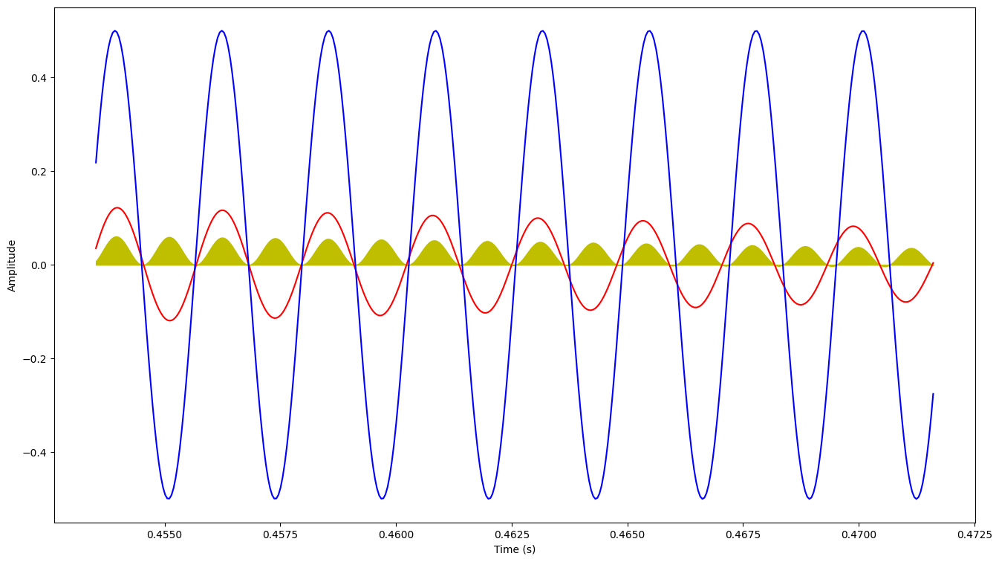

In [49]:
f = 433
phase = 0.3

sin = 0.5 * np.sin(2*np.pi * (f * t - phase ))

plt.figure(figsize=(16,9))
plt.plot(t[10000:10400], sines[10000:10400], color="r")
plt.plot(t[10000:10400], sin[10000:10400], color="b")
plt.fill_between(t[10000:10400], sin[10000:10400]*sines[10000:10400], color="y")

plt.xlabel("Time (s)")
plt.ylabel("Amplitude")

By filling the area below the waveform, the intuition is that the higher the positiver area for the combined signal, the higher the similarity between the two signals is.



Text(0, 0.5, 'Amplitude')

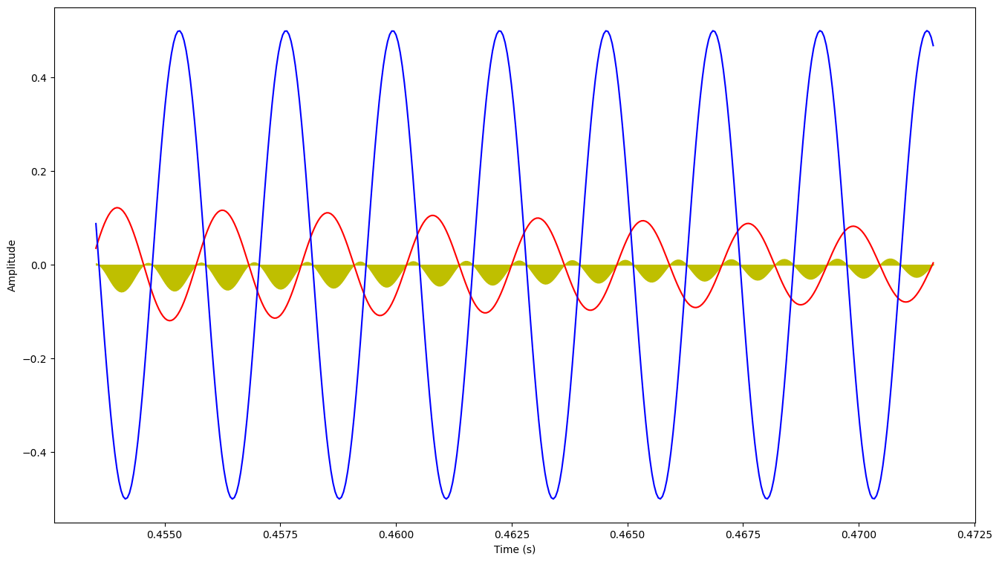

In [50]:
f = 433
phase = 0.9

sin = 0.5 * np.sin(2*np.pi * (f * t - phase ))

plt.figure(figsize=(16,9))
plt.plot(t[10000:10400], sines[10000:10400], color="r")
plt.plot(t[10000:10400], sin[10000:10400], color="b")
plt.fill_between(t[10000:10400], sin[10000:10400]*sines[10000:10400], color="y")

plt.xlabel("Time (s)")
plt.ylabel("Amplitude")

Same sinewave, same amplitude and frequency, but no similarity.

Text(0, 0.5, 'Amplitude')

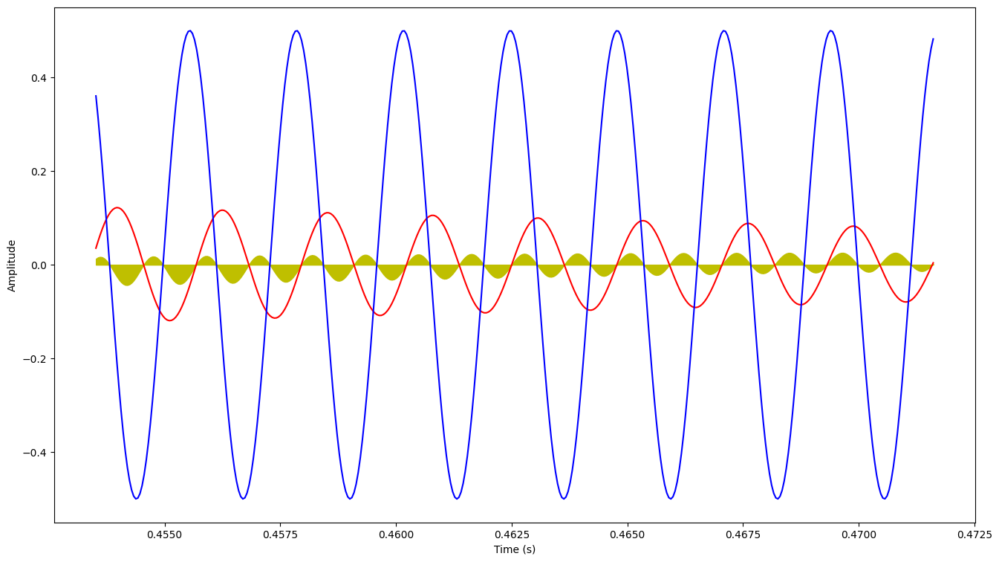

In [51]:
f = 433
phase = 0

sin = 0.5 * np.sin(2*np.pi * (f * t - phase ))

plt.figure(figsize=(16,9))
plt.plot(t[10000:10400], sines[10000:10400], color="r")
plt.plot(t[10000:10400], sin[10000:10400], color="b")
plt.fill_between(t[10000:10400], sin[10000:10400]*sines[10000:10400], color="y")

plt.xlabel("Time (s)")
plt.ylabel("Amplitude")

A bit negative, and a bit positive.

Chose frequency -> Optimise phase (maximum similarity) -> Calculate the magnitude (positive area of combined area - the negative area)

In a fourier transform we try to do this for all possible frequencies.

Which frequnecies are important components of the original signals? Indicated by high magnitude value.

# Reconstructing a signal
## Inverse fourier transform (IFT)
- Superimpose sinusoid
- Weight them by the relative magnitude
- Use relatie phase
- Original signal and FT have the same information


## Complex Numbers


https://youtu.be/DgF4m0AWCgA?si=oVNijybD6j386tXW

Why bother with complex numbers?
- Fourier transform -> magnitude & phase
    - Magnitude is a real number
    - No compact way of dealing with phase and magnitude
    - Something with magnitude + phase?
    - -> Complex numbers

#### History of complex numbers

$\sqrt{-1}$

– What about $i$?

– Yeah for sure. $i^2 = -1$ ?

– Makes perfect sense.

$c = a + ib$

$a, b \in \R$

x axis real,
y axis imaginary

From cartesian coordinate to Polar coordinate representation

$\gamma$ = angle between positive real axis and line that connects the origin with the complex number

$|c| = \sqrt{a^2+b^2}$

$\cos(\gamma) = \frac{a}{|c|}$

$\sin{\gamma} = \frac{b}{|c|}$

$\gamma = arctan (\frac{a}{b})$


$c = |c| \cdot (\cos{\gamma} + i \sin(\gamma))$

Gamma = phase, C = magnitude

### Euler formula

$e^{i\gamma} = \cos(\gamma) + i\sin(\gamma)$

### Euler identity

$e^{i\pi} + 1 = 0$

### Polar definition of complex number

$c = |c|\cdot e^{i\gamma}$

## Encode magnitude and phase as a single complex number


https://www.youtube.com/watch?v=KxRmbtJWUzI&list=PL-wATfeyAMNqIee7cH3q1bh4QJFAaeNv0&index=12

$\varphi_f = argmax_{\varphi\in[0,1)]}(\int s(t)\cdot \sin(2\pi \cdot(ft-\varphi ))\cdot dt)$

$d_f = \max_{\varphi\in[0,1)]}(\int s(t)\cdot \sin(2\pi \cdot(ft-\varphi ))\cdot dt)$

$c = |c|\cdot e^{i\gamma}$

## Complex fourier transform coefficient $c_f$

$c_f = \frac{d_f}{\sqrt{2}}\cdot e^{-i2\pi\varphi_{f}}$



## From DFT to FFT

https://www.youtube.com/watch?v=ZUi_jdOyxIQ&list=PL-wATfeyAMNqIee7cH3q1bh4QJFAaeNv0&index=13

- DFT is computonally expensive (N<sup>2</sup>)
- FFT is more efficient (Nlog<sub>2</sub>N)
- FFT exploits redundancies across sinusoids
- FFT works when N is a power of 2

# How to extract FT

Why do we percieve timbre different?

In [52]:
import numpy as np
import matplotlib.pyplot as plt
import os
import librosa
import IPython.display as ipd

In [53]:
BASE_DIR = "/Users/helvetica/SignalProcessing/data"

violin_file = "one-shots/violin_c4.wav"
riddim_file = "one-shots/riddim_screech.wav"
piano_file = "one-shots/piano_c3.wav"

In [54]:
ipd.Audio(os.path.join(BASE_DIR, violin_file))

In [55]:
ipd.Audio(os.path.join(BASE_DIR, piano_file))

In [56]:
ipd.Audio(os.path.join(BASE_DIR, riddim_file))

In [57]:
violin_c4, sr = librosa.load(os.path.join(BASE_DIR, violin_file))
piano_c3, sr = librosa.load(os.path.join(BASE_DIR, piano_file))
riddim, sr = librosa.load(os.path.join(BASE_DIR, riddim_file))

In [58]:
violin_c4.shape # Number of samples with the default sample rate

(44100,)

In [59]:
violin_ft = np.fft.fft(violin_c4) # Move from time domain to frequency domain

In [60]:
violin_ft.shape # Same shape as the signal itself (As many frequency bins as the n of samples in original time domain rep)

(44100,)

In [61]:
# First fourier coefficient
violin_ft[0]

(-0.007296082829043371+0j)

Complex number with real and imaginary part.

We don't care that much about phase, we care more about how much a freq is present, so magnitude is more informative.

We discard the phase.

Move from fourier coefficient to magnitude spectrum by taking the abs value of the fourier coefficient:

In [62]:
magnitude_spectrum_violin = np.abs(violin_ft)

In [63]:
magnitude_spectrum_violin[0]

0.007296082829043371

We no longer have a complex number, just a single real number, which is the magnitude associated with the first frequency bin.

In [64]:
def plot_magnitude_spectrum(signal, title, sr):
    ft = np.fft.fft(signal)
    magnitude_spectrum = np.abs(ft)

    plt.figure(figsize=(16,9))
    # Taking a range (0, sample rate), and take as many freq bin
    frequency = np.linspace(0, sr, len(magnitude_spectrum))
    plt.plot(frequency, magnitude_spectrum)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Magnitude")
    plt.title(title)
    plt.show()

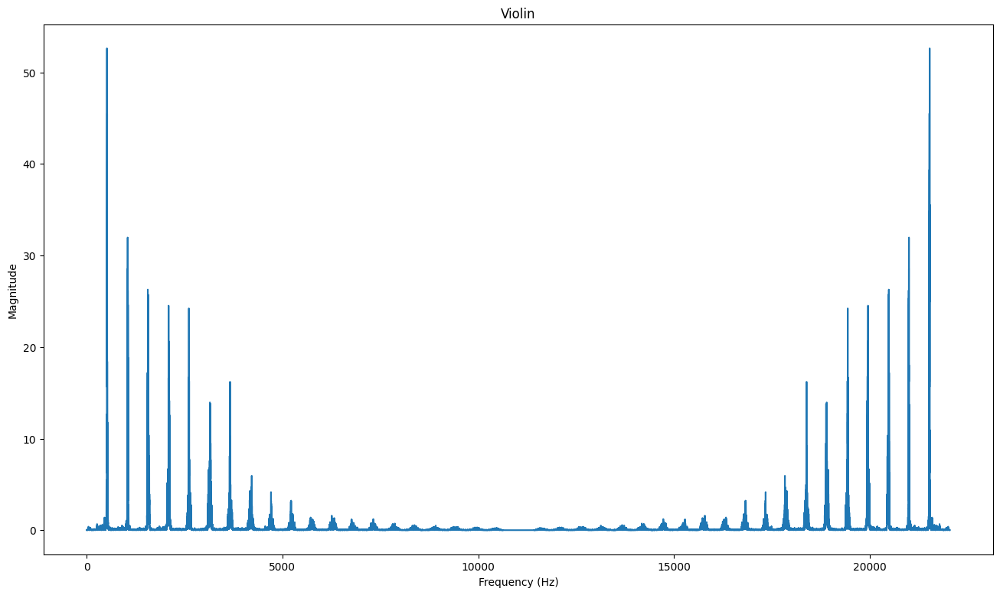

In [65]:
plot_magnitude_spectrum(violin_c4, "Violin", sr)

In [66]:
def plot_magnitude_spectrum(signal, title, sr, f_ratio=1):
    ft = np.fft.fft(signal)
    magnitude_spectrum = np.abs(ft)

    plt.figure(figsize=(16,9))
    # Taking a range (0, sample rate), and take as many freq bin
    frequency = np.linspace(0, sr, len(magnitude_spectrum))
    n_freq_bins = int(len(frequency) * f_ratio)

    plt.plot(frequency[:n_freq_bins], magnitude_spectrum[:n_freq_bins])
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Magnitude")
    plt.title(title)
    plt.show()

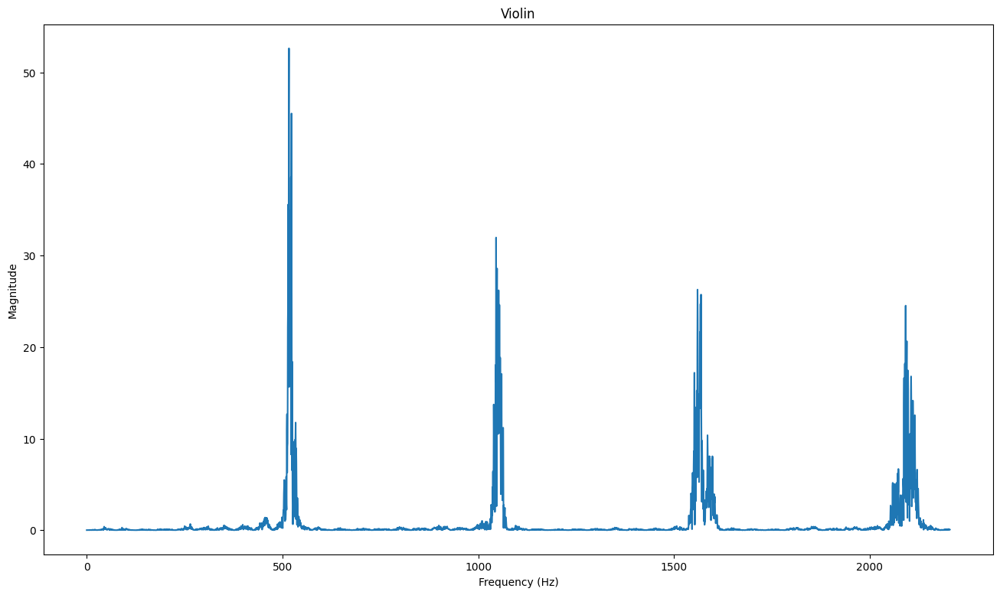

In [67]:
plot_magnitude_spectrum(violin_c4, "Violin", sr, f_ratio=0.1)

The fundamental freq can be found at around 500 Hz, and then we have the first, second and fourth harmonic.



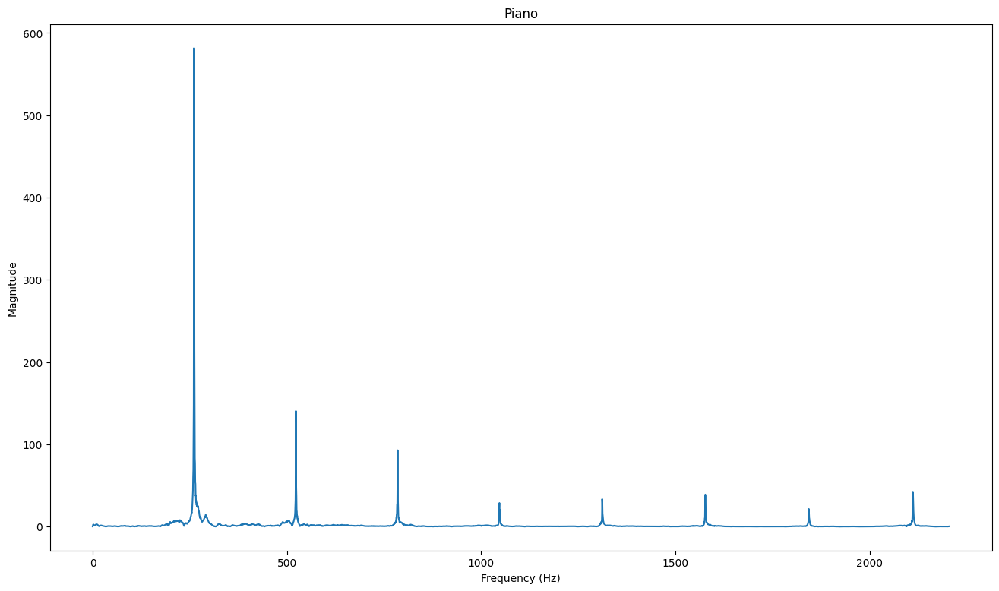

In [68]:
plot_magnitude_spectrum(piano_c3, "Piano", sr, f_ratio=0.1)

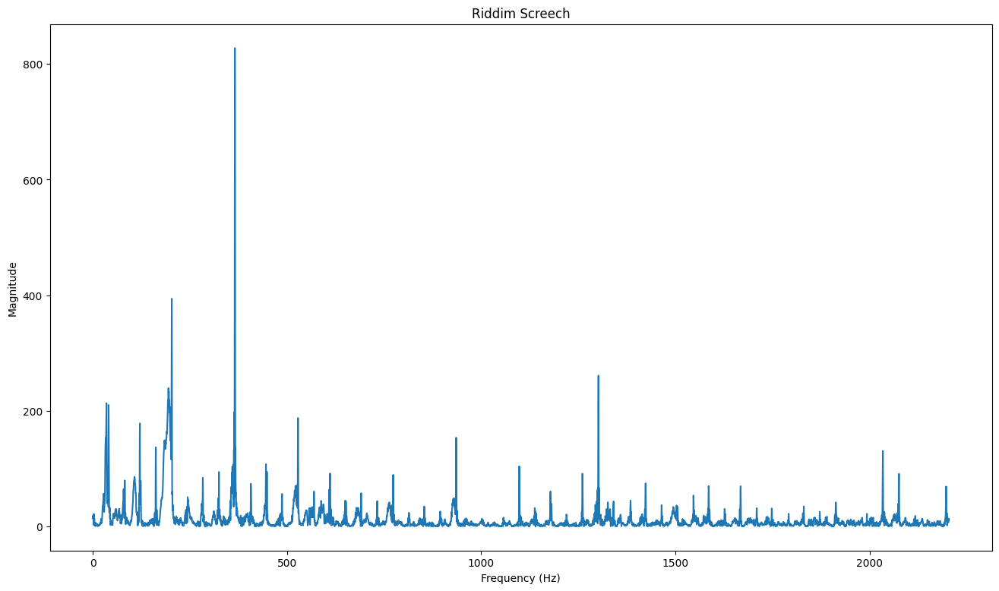

In [69]:
plot_magnitude_spectrum(riddim, "Riddim Screech", sr, f_ratio=0.1)

Almost a noise.

We lose the information within the time spectrum.

Using Short-Time FT we can extract a spectrum, which is the main feature in ML.

# Short-Time Fourier Transform

https://www.youtube.com/watch?v=-Yxj3yfvY-4&list=PL-wATfeyAMNqIee7cH3q1bh4QJFAaeNv0&index=15

Audio data is very dynamic, we want to know how these different freq components evolve over time.

We don't perform the FT on the entire signal, but on frames.

- Apply windowing function
    - $x_w (k) = x(k)\cdot w(k)$

- Window size is usually = frame size, but frame size could be larger than frame size

In librosa, we are not forced to pass the window size, default value is the frame size.

- Hop size: how many samples we slide to the "right" when we take a new frame.

### Outputs
**DFT**
- Spectral vector (n freq bins)
- N complex Fourier coefficients

**STFT**
- Spectral matrix (n frequency bins, n frames)
- Complex fourier coefficient

n frequency bins = (framesize / 2) + 1

N frequency bins from DFT = n of samples in the whole signal
in STFT, we don't consider the whole sample at once, but rather a frame sized n of samples
the n of freq bins for each FT is equal to the frame size, **but** the DFT is symmetrical (nyqvist) in SFTF we only take the first half, because of redundancy

n frames = (samples - framesize / hopsize) + 1

### Example STFT output
Signal = 10 K samples
Frame size = 1000
Hop size = 500

n freq bins = 1000/2 + 1 = 501 bins -> range(0 Hz, sampling rate/2 (nyqvist))

n frames = (10000 - 1000) / 500 + 1 = 19

STFT -> 509, 19

### STFT Parameters
- Frame size (how big are the chunks we divide our original signal into)
    - Samples (512, 1024, 2028, etc)
    - Time / freq trade off:
        - Large frame size: freq resolution increased, time res decreased
        - Smaller frame size: freq resolution decreased, time res increased
        - Depends on application

- Hop size
    - Samples we slide to the "right"
    - Fractions of the frame size

- Windowing function
    - Modulate the original signal which will effect the STFT results
    - Rectangle (create discontinuos on edges)
    - Bell shape curve (Hann window)
        - Modulates the signal, avoiding discontinuation on edges of signal (spectral leakage)



## Visualizing sound with a spectrogram

$Y(m,k) = |S(m,k)|^2$

We take the squared magnitude of the STFT to get a matrix with the same shape as the original FT but with all of the items as real numbers.

As such, we visualize the spectrum with a heatmap.


---

# Extracting spectrograms from audio

In [70]:
full_drum_loop, sr = librosa.load(os.path.join(BASE_DIR, "wav-loops/its_0_drum_full_loop.wav"))
melody_dmin, sr = librosa.load(os.path.join(BASE_DIR, "wav-loops/mel_0_dmin_descending.wav"))

In [71]:
ipd.Audio(os.path.join(BASE_DIR, "wav-loops/mel_0_dmin_descending.wav"))

In [72]:
ipd.Audio(os.path.join(BASE_DIR, "wav-loops/its_0_drum_full_loop.wav"))

# Extracting Short-Time Fourier Transform

In [73]:
FRAME_SIZE = int(2048 / 4)
HOP_SIZE = int(512 / 4)

In [74]:
S_drum_loop = librosa.stft(full_drum_loop, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

In [75]:
S_drum_loop.shape # frequency bins & frames

(257, 690)

In [76]:
type(S_drum_loop[0][0])

numpy.complex64

## Calculating the spectrogram

In [77]:
Y_drum_loop = np.abs(S_drum_loop) ** 2

In [78]:
Y_drum_loop.shape

(257, 690)

In [79]:
type(Y_drum_loop[0][0])

numpy.float32

## Visualize the spectrogram

In [80]:
def plot_spectrogram(Y, sr, hop_length, y_axis="log"):
    plt.figure(figsize=(25,10))
    librosa.display.specshow(Y, sr=sr, hop_length=hop_length, x_axis="time", y_axis=y_axis)

    plt.colorbar(format="%+2.f")

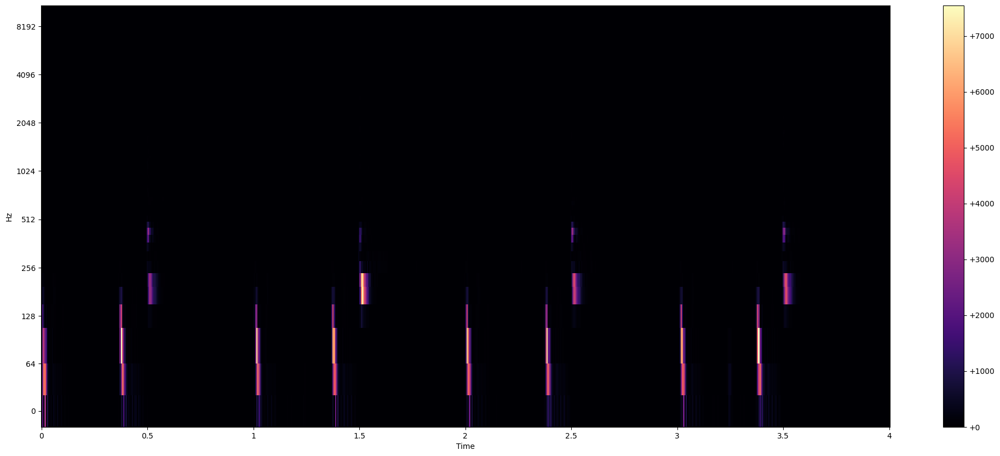

In [81]:
plot_spectrogram(Y_drum_loop, sr, HOP_SIZE)

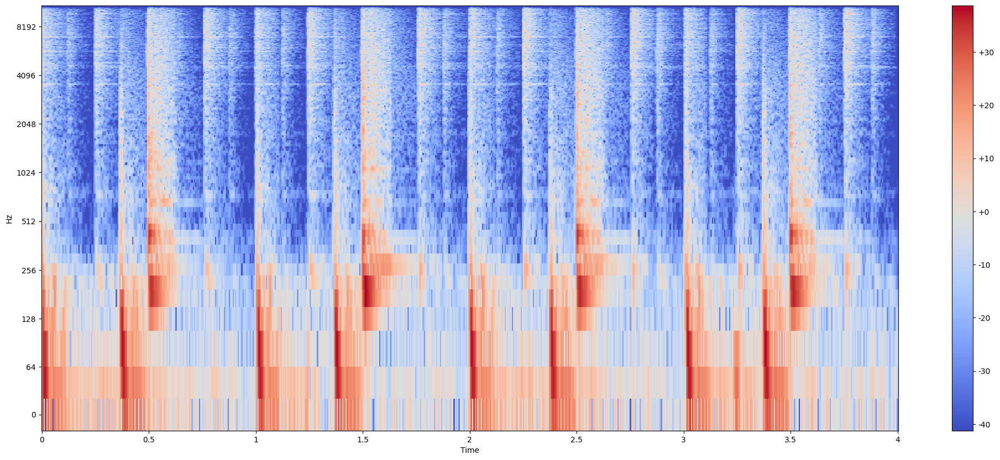

In [82]:
Y_log_drum_loop = librosa.power_to_db(Y_drum_loop)
plot_spectrogram(Y_log_drum_loop, sr, HOP_SIZE)

# Mel-spectrogram

The way we percieve pitch is not linear, but rather logarithmical.

An ideal audio feature is a time-frequency representation with perceptually relevand amplitude and frequency representaion.

Mel spectrograms are related to the mel scale, which is a perceptual scale for pitch.

It's a logarithmic scale where 1000 Hz = 1000 Mel.

$ m = 2595 \cdot log(1+\frac{f}{500})$

$ f = 700(10^{m \ 2696}-1)$

- Extract STFT
- Convert amplitude to DBs
- Convert freq to Mel scale


1. Chose a number of mel bands
2. Construct mel filter banks
3. Apply mel filter banks to spectrogram

### Chose a number of mel bands
Number of mel bands is a very fundamental parameter which can vary. 40, 60, 90. 128? Sure! It depends on the problem.

It's the same as asking what learning rate to use, so in a way its a hyper parameter.

The idea of a mel band is like a range of relevat frequencies.

### Construct mel filter banks

$ m = 2595 \cdot log(1+\frac{f}{500})$

1. Convert lowest/highest freq to Mel
2. Create n bands equally spaced points as the number of mel bands we want to use
    - Mel points are the centers of the mel bands
3. Converting the points back to Hertz ($ f = 700(10^{m \ 2696}-1)$)
4. Round to nearest frequency bin
    - Discrete signals, we don't have perfect resolution which is constrained by FT frame size
5. Create triangular filters ´
    - Building blocks of mel filter banks

![alt text](assets/img/mel_filter_bank.png)

Spread out the frequencies to get the same perception.

To construct a single triangular filter for one mel band, the center for the second mel band is 1526, the lower end and higher ends are the centers of the previous and next melbands.

### Mel filter bank's shape
M = (n bands, framesize / 2 + 1)

Y = (framesize / 2 + 1, n frames)

Number of columns in M is equal to the number of rows in Y.

This means we can apply matrix multiplication.

Mel spectrogram = MY




# Extracting mel spectrograms

melody_dmin, sr = librosa.load(os.path.join(BASE_DIR, "wav-loops/mel_0_dmin_descending.wav"))

### Mel filter banks

In [83]:
filter_banks = librosa.filters.mel(n_fft=2048, sr=22050, n_mels=10)

In [84]:
filter_banks.shape

(10, 1025)

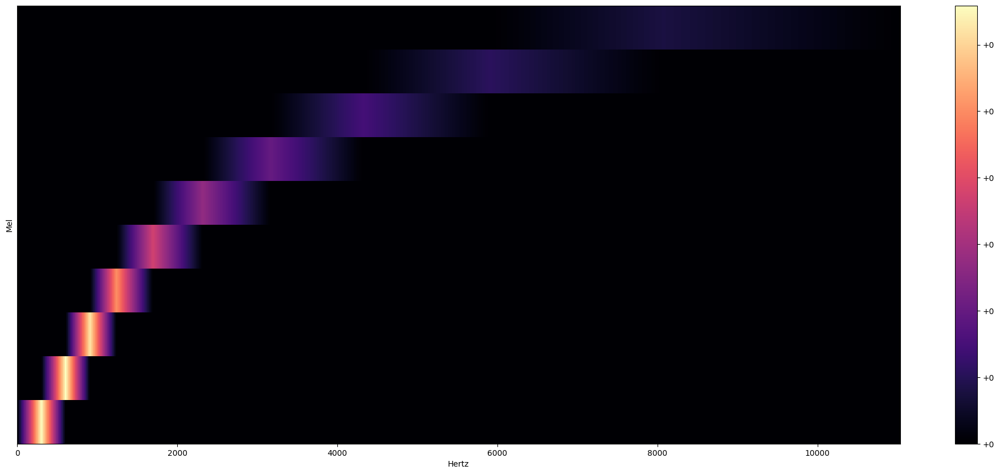

In [85]:
plt.figure(figsize=(25,10))
librosa.display.specshow(filter_banks, sr=sr, x_axis="linear")
plt.xlabel("Hertz")
plt.ylabel("Mel")
plt.colorbar(format="%+2.f")

In [86]:
mel_spectrogram = librosa.feature.melspectrogram(y=melody_dmin, sr=sr, n_fft=2048, hop_length=512, n_mels=10)

In [87]:
mel_spectrogram.shape

(10, 173)

In [88]:
log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)

Moving to power_to_db is important, since we don't percieve linear. 

It doesn't change the shape of the mel spectrogram.

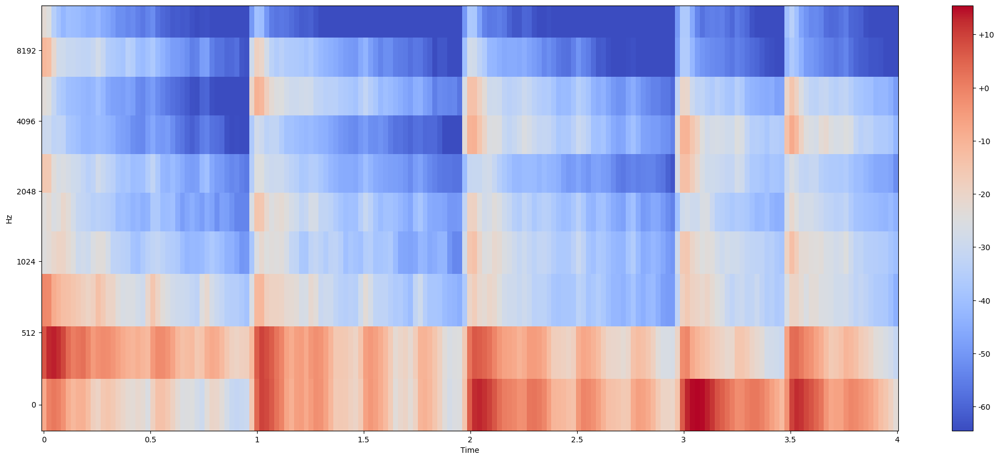

In [89]:
plt.figure(figsize=(25,10))
librosa.display.specshow(log_mel_spectrogram, x_axis="time", y_axis="mel", sr=sr)
plt.colorbar(format="%+2.f")

---

[Mel-Frequency Cepstral Coefficients explained](https://www.youtube.com/watch?v=4_SH2nfbQZ8&list=PL-wATfeyAMNqIee7cH3q1bh4QJFAaeNv0&index=19)

# Raw waveforms into MFCC (Mel-Frequency Cepstral Coefficients)

-> Short-Time Fourier Transform

If we just do FFT, we will just change the time to be frequency and the magnitude of the frequencies.
Basically expanding signal in terms of sines and cosines.

We want to keep both the time and the frequency. To do that, we want STFT (Short-Time Fourier Transform)

x -> signal in the time domain:

$ x \in \mathbb{R}^{28200 = 3.525 seconds \times 8000 hz}$

Think of the signal in the time domain as a long vector.

8000 samples represents the signal / second, so in total 28 200 dimensions for x.

g -> sliding window function (e.g. Hammering function) (more on this later)

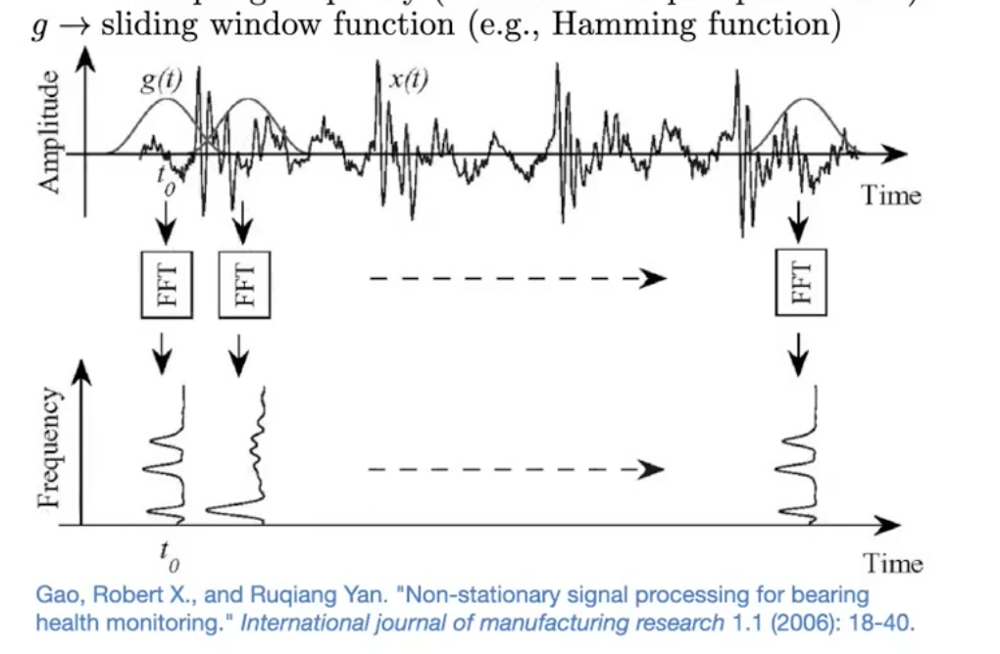

[Gao, Robert X. Ruqiang Yan "Non stationary signal processing for bearing health monitoring"](https://www.researchgate.net/publication/220650705_Non-stationary_signal_processing_for_bearing_health_monitoring)

[Gao, Robert X. Ruqiang Yan "Non stationary signal processing for bearing health monitoring." International journal of manufacturing research 1.1 (2006): 18-40](https://www.researchgate.net/publication/220650705_Non-stationary_signal_processing_for_bearing_health_monitoring)

$ X_i \in \mathbb{R}^{200} $ -> i:th frame of signal x (25 ms frames)

80 -> frame step (10 ms) -> $X \in \mathbb{R}^{200 \times 350} (350=28,200-200)/80) $

$\bar{X}_{i} \in \mathbb{C}^{k}$ -> Discrete fourier tranform of $X{i}$ -> $\bar{X} \in \mathbb{C}^{K \times 350}$

The Discrete Fourier Transform

$\bar{X_i}(k) = \sum\limits_{n=1}^{N}{x_{i}(n)g(n)e^{-j2\pi kn/N}},k = 1, ..., K$

n is the size of the signal per each frame

N = 200

K = 257 -> Number of discrete fourier transform coefficients 

Because we don't like working with complex numbers, we're going to take tha absolute values of the complex numbers

$P_{i}(k) = \frac{1}{N}|\bar{X}_{i}(k)|^2$ -> Periodogram esitmate of the power spectrum

-> $P \in \mathbb{R}^{257 \times 350}$

Mel-spaced Filterbank
300 Hz -> lower frequency
4000 Hz -> upper frequency

$M(f) = 1,25 ln(1+ f/700)$ -> convert frequency to Mel scale

$M^{-1}(m)=700(exp(m/1,125)-1)$ -> Convert Mel scale to Hz

$M^{-1}(linspace(M(300),M(4,000),26+2))$ Linear 

26 triangular (linear) filters that we can put in a matrix

(26 triangles x 257)

-> $E = TP \in \mathbb{R}^{26 \times 350}$

$E_{i}(l)$ -> amount of energy in filter bank l at frame i

$log(E) \in \mathbb{R}^{26 \times 350}$ -> log filter bank energy

If we take the log, we will get a **log** Mel spectrogram, this is what the neural network will see.

This is for Deep learning.

One extra last step:

We could get MFCC Coefficients from Discrete Cosine Transform (DCT) (getting rid of the sines)

We lose *some* information by performing DCT to get MFCC Coefficients.


In [90]:
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np

In [91]:
audio_file = "data/wav-loops/mel_0_dmin.wav"


In [92]:
signal, sr = librosa.load(audio_file)

In [93]:
ipd.Audio(audio_file)

## Extracting MFCCs

In [94]:
mfccs = librosa.feature.mfcc(y=signal, n_mfcc=13, sr=sr)

In [95]:
mfccs.shape


(13, 173)

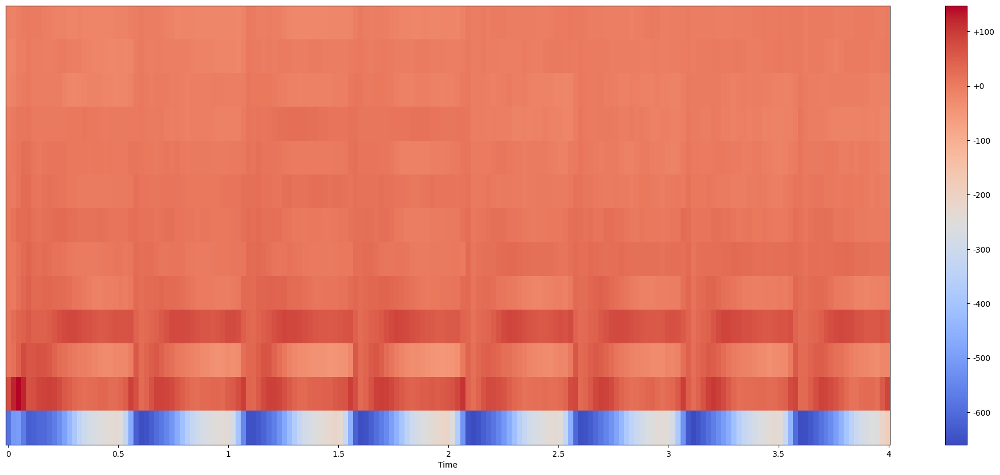

In [96]:
plt.figure(figsize=(25, 10))
librosa.display.specshow(mfccs, 
                         x_axis="time", 
                         sr=sr)
plt.colorbar(format="%+2.f")
plt.show()

## Computing first / second MFCCs derivatives


In [97]:
delta_mfccs = librosa.feature.delta(mfccs)

In [98]:
delta2_mfccs = librosa.feature.delta(mfccs, order=2)

In [99]:
delta_mfccs.shape

(13, 173)

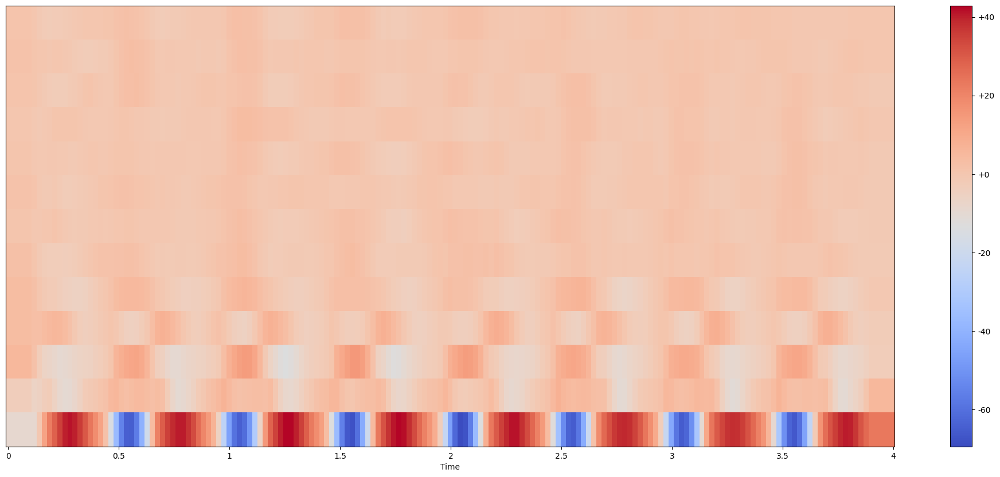

In [100]:
plt.figure(figsize=(25, 10))
librosa.display.specshow(delta_mfccs, 
                         x_axis="time", 
                         sr=sr)
plt.colorbar(format="%+2.f")
plt.show()

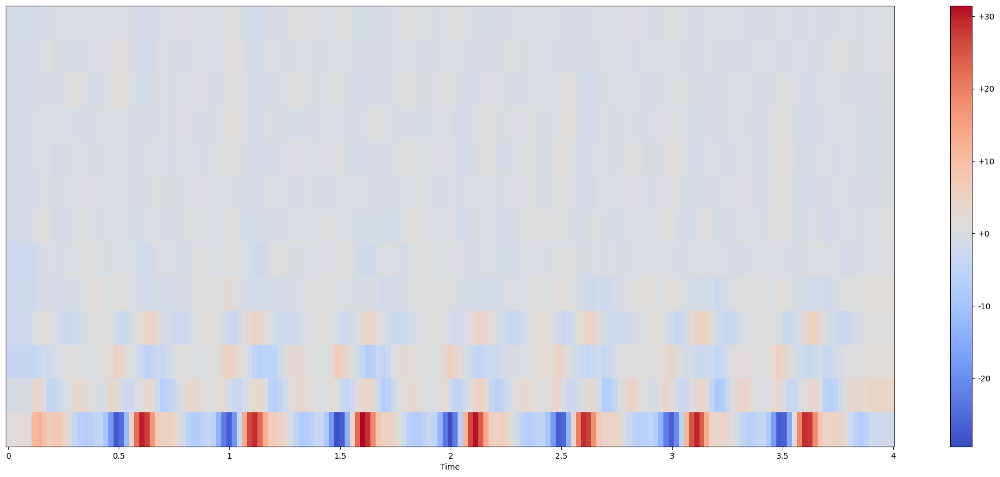

In [101]:
plt.figure(figsize=(25, 10))
librosa.display.specshow(delta2_mfccs, 
                         x_axis="time", 
                         sr=sr)
plt.colorbar(format="%+2.f")
plt.show()

In [102]:
mfccs_features = np.concatenate((mfccs, delta_mfccs, delta2_mfccs))

In [103]:
mfccs_features.shape

(39, 173)

# Frequency-domain audio features

Waveform -> STFT -> Feature computation

$m_t (n)$ -> Magnitude of signal at frequency bin n frame t


### Band energy ratio (BER)
- Comparison of energy in the lower/higher freq band
- Measure of how dominant low frequencies are


$BER_t = \frac{\sum\limits_{n=1}^{F-1}m_t (n)^2}{\sum\limits_{n=F}^{N}m_t (n)^2}$

$F$ = split frequency

- Used for music / speech discrimination
- Music classification / mood classification


### Spectral centroid (SC)
- Centre of gravity of magnitude spectrum
- Frequency band where most of the energy is concentrated
- Measure of "brightness" of sound

Weighted mean of the frequencies

$SC_t = \frac{\sum\limits_{n=1}^{N} m_t (n) \cdot n}{\sum\limits_{n=1}^{N}m_t (n)}$

$n$ = frequency bin

$m_t (n)$ = magnitude for the specific frequency bin at frame t (weight for n)

dividing everything by sum of weights, weighted min of the freq bins

- Audio classification
- Music classification


### Bandwidth (BW)
- Derived from spectral centroid
- Spectral range around the centroid
- Variance from the spectral centroid
- Descibes percieved timbre

A weighted mean of the distances of frequency bands from the SC

$BW_t = \frac{\sum\limits_{n=1}^{N}|n-SC_t |\cdot m_t (n)}{\sum\limits_{n=1}^{N}m_t (n)}$

$|n - SC_t|$ = Distance of frequency band from spectral centroid

Once again, divided by a weighted min


- Music processing (music genre/mood classification)


## Extracting BER (Band Energy Ratio)

In [104]:
FRAME_SIZE = 2048
HOP_SIZE = 512

signal, sr = librosa.load(audio_file)

# Extract spectrogram
dmin_spec = librosa.stft(signal, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

$SC_t = \frac{\sum\limits_{n=1}^{N} m_t (n) \cdot n}{\sum\limits_{n=1}^{N}m_t (n)}$

Cannot pass in continuous function, need to create a function that maps continuous function.

In [105]:
dmin_spec.shape

(1025, 173)

1025 freq bins. What do they correspond to in terms of freq range?

In [106]:
# Calculate band energy ratio

def calculate_split_frequency_bin(spectrogram, split_freq, sr):
    freq_range = sr / 2

    # calculate delta freq between two adjacent bins
    
    freq_delta_per_bin = freq_range / spectrogram.shape[0]

    split_freq_bin = np.floor(split_freq / freq_delta_per_bin)

    return int(split_freq_bin)


In [107]:
split_freq_bin = calculate_split_frequency_bin(dmin_spec, 2000, 22050)
split_freq_bin

185

In [108]:
dmin_specc_transpose = dmin_spec.T

In [109]:
dmin_specc_transpose.shape

(173, 1025)

In [110]:
def calculate_band_energy_ratio(spectrogram, split_freq, sr):
    split_freq_bin = calculate_split_frequency_bin(spectrogram, split_freq, sr)

    # move to the power spectrogram
    power_spec = np.abs(spectrogram) ** 2

    # get transpose of spectrogram
    power_spec = power_spec.T

    # iterate through power spectrogram, frame by frame
    band_energy_ratio = []

    for freq_in_frame in power_spec:

        # values for each frame
        sum_power_low_frequencies = np.sum(freq_in_frame[:split_freq_bin])
        sum_power_high_frequencies = np.sum(freq_in_frame[split_freq_bin:])

        ber_current_frame = sum_power_low_frequencies / sum_power_high_frequencies

        band_energy_ratio.append(ber_current_frame)
    
    return np.array(band_energy_ratio)

In [111]:
ber_dmin = calculate_band_energy_ratio(dmin_spec, 2000, sr)

In [112]:
ber_dmin.shape

(173,)

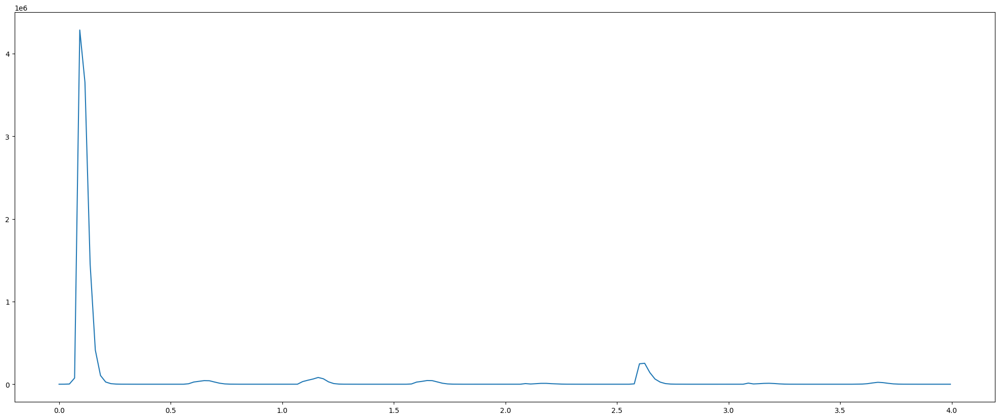

In [113]:
# Visualize band energy ratio curves 

frames = range(len(ber_dmin))

t = librosa.frames_to_time(frames, hop_length=HOP_SIZE)

plt.figure(figsize=(25,10))
plt.plot(t, ber_dmin)
plt.show()

# Extracting SC (Spectral Centroid)



In [114]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

dmin_melody = "data/wav-loops/mel_0_dmin.wav"
dmin, sr = librosa.load(audio_file)

sc_dmin = librosa.feature.spectral_centroid(y=dmin, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [115]:
sc_dmin.shape # Value for each frame

(173,)

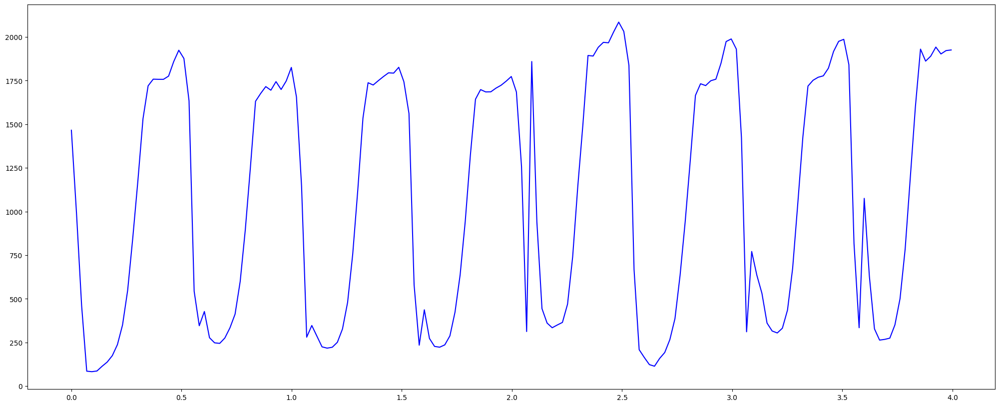

In [116]:
frames = range(len(sc_dmin))
t = librosa.frames_to_time(frames)

plt.figure(figsize=(25,10))
plt.plot(t, sc_dmin, color='b')
plt.show()

# Calculate bandwidth

In [117]:
bw_dmin = librosa.feature.spectral_bandwidth(y=dmin, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

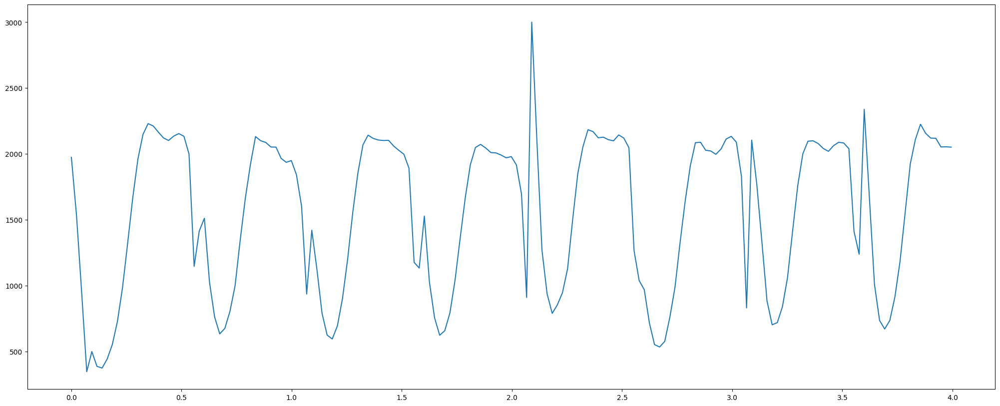

In [118]:
plt.figure(figsize=(25,10))
plt.plot(t, bw_dmin)
plt.show()